In [ ]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Exploratory Data Analysis (EDA)

## Load Data

In [ ]:
df = pd.read_csv('hotel_bookings_data.csv')

## Descriptive Statistics

### Mengecek tipe data setiap kolom dan jumlah nilai yang hilang

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 29 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           119390 non-null  object 
 1   is_canceled                     119390 non-null  int64  
 2   lead_time                       119390 non-null  int64  
 3   arrival_date_year               119390 non-null  int64  
 4   arrival_date_month              119390 non-null  object 
 5   arrival_date_week_number        119390 non-null  int64  
 6   arrival_date_day_of_month       119390 non-null  int64  
 7   stays_in_weekend_nights         119390 non-null  int64  
 8   stays_in_weekdays_nights        119390 non-null  int64  
 9   adults                          119390 non-null  int64  
 10  children                        119386 non-null  float64
 11  babies                          119390 non-null  int64  
 12  meal            

### Sampling untuk memahami data

In [ ]:
df.sample(5)

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_weekdays_nights,adults,...,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status
20363,Resort Hotel,0,6,2018,March,5,24,2,0,2,...,0,No Deposit,240.0,NaN,0,Personal,48.0,0,0,Check-Out
108045,City Hotel,0,5,2019,May,12,20,1,1,1,...,0,No Deposit,37.0,NaN,0,Family,85.0,0,0,Check-Out
30965,Resort Hotel,0,87,2018,February,49,3,2,5,2,...,3,No Deposit,240.0,NaN,0,Family,143.0,0,2,Check-Out
46562,City Hotel,0,6,2018,March,2,7,0,3,2,...,0,No Deposit,9.0,NaN,0,Family,89.0,0,0,Check-Out
6634,Resort Hotel,1,127,2018,August,26,21,2,5,2,...,0,No Deposit,240.0,NaN,0,Personal,106.0,0,1,No-Show


In [ ]:
# Memisahkan antara fitur kategorikal dan numerikal
cats = ['hotel', 'arrival_date_month', 'meal', 'city', 'market_segment', 'distribution_channel', 'deposit_type', 'customer_type',
        'reservation_status']
nums = ['is_canceled', 'lead_time', 'arrival_date_year', 'arrival_date_week_number', 'arrival_date_day_of_month',
        'stays_in_weekend_nights', 'stays_in_weekdays_nights', 'adults', 'children', 'babies', 'is_repeated_guest',
        'previous_cancellations', 'previous_bookings_not_canceled', 'booking_changes', 'agent', 'company', 'days_in_waiting_list',
        'adr', 'required_car_parking_spaces', 'total_of_special_requests']

In [ ]:
df[cats].describe()

,hotel,arrival_date_month,meal,city,market_segment,distribution_channel,deposit_type,customer_type,reservation_status
count,119390,119390,119390,118902,119390,119390,119390,119390,119390
unique,2,12,5,177,8,5,3,4,3
top,City Hotel,October,Breakfast,Kota Denpasar,Online TA,TA/TO,No Deposit,Personal,Check-Out
freq,79330,13877,92310,48590,56477,97870,104641,89613,75166


- Semua sudah sesuai, tidak ditemukan adanya keanehan pada data kategorikal.

In [ ]:
df[nums].describe()

,is_canceled,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_weekdays_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,agent,company,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests
count,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119386.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,103050.000000,6797.000000,119390.000000,119390.000000,119390.000000,119390.000000
mean,0.370416,104.011416,2018.156554,27.165173,15.798241,0.927599,2.500302,1.856403,0.103890,0.007949,0.031912,0.087118,0.137097,0.221124,86.693382,189.266735,2.321149,101.831122,0.062518,0.571363
std,0.482918,106.863097,0.707476,13.605138,8.780829,0.998613,1.908286,0.579261,0.398561,0.097436,0.175767,0.844336,1.497437,0.652306,110.774548,131.655015,17.594721,50.535790,0.245291,0.792798
min,0.000000,0.000000,2017.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,6.000000,0.000000,-6.380000,0.000000,0.000000
25%,0.000000,18.000000,2018.000000,16.000000,8.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.000000,62.000000,0.000000,69.290000,0.000000,0.000000
50%,0.000000,69.000000,2018.000000,28.000000,16.000000,1.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,14.000000,179.000000,0.000000,94.575000,0.000000,0.000000
75%,1.000000,160.000000,2019.000000,38.000000,23.000000,2.000000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,229.000000,270.000000,0.000000,126.000000,0.000000,1.000000
max,1.000000,737.000000,2019.000000,53.000000,31.000000,19.000000,50.000000,55.000000,10.000000,10.000000,1.000000,26.000000,72.000000,21.000000,535.000000,543.000000,391.000000,5400.000000,8.000000,5.000000


- Fitur is_canceled, arrival_date_year, total_of_special_requests dan is_repeated_guest akan diubah menjadi kategorikal
- Fitur lead_time memiliki outlier (nilai max sangat tinggi) dibandingkan dari nilai mean, median, dan kuartilnya. Akan dilakukan handling outlier.

### Cek nilai kosong

In [ ]:
df.isna().sum()

hotel                                  0
is_canceled                            0
lead_time                              0
arrival_date_year                      0
arrival_date_month                     0
arrival_date_week_number               0
arrival_date_day_of_month              0
stays_in_weekend_nights                0
stays_in_weekdays_nights               0
adults                                 0
children                               4
babies                                 0
meal                                   0
city                                 488
market_segment                         0
distribution_channel                   0
is_repeated_guest                      0
previous_cancellations                 0
previous_bookings_not_canceled         0
booking_changes                        0
deposit_type                           0
agent                              16340
company                           112593
days_in_waiting_list                   0
customer_type   

- Terdapat missing value pada fitur children, city, agent, dan company
- Akan dilakukan handling missing value di tahap data preprocessing
- Fitur company akan dihilangkan/drop karena didominasi oleh data null.

### Rangkuman value setiap fitur

In [ ]:
for col in cats:
    print(f'''Value count kolom {col}:''')
    print(df[col].value_counts())
    print()

Value count kolom hotel:
hotel
City Hotel      79330
Resort Hotel    40060
Name: count, dtype: int64

Value count kolom arrival_date_month:
arrival_date_month
October      13877
September    12661
July         11791
December     11160
June         11089
August       10939
November     10508
May           9794
April         8068
January       6794
February      6780
March         5929
Name: count, dtype: int64

Value count kolom meal:
meal
Breakfast     92310
Dinner        14463
No Meal       10650
Undefined      1169
Full Board      798
Name: count, dtype: int64

Value count kolom city:
city
Kota Denpasar              48590
Kabupaten Bangka           12129
Kota Yogyakarta            10415
Kota Batu                   8568
Kabupaten Bandung           7287
                           ...  
Kabupaten Malang               1
Kabupaten Bekasi               1
Kabupaten Barito Kuala         1
Kota Palembang                 1
Kabupaten Maluku Tengah        1
Name: count, Length: 177, dtype: int64

Rangkuman di atas menunjukkan jumlah dari masing-masing kategori setiap fitur diurutkan dari pengunjung terbanyak.

### Univariate Analysis

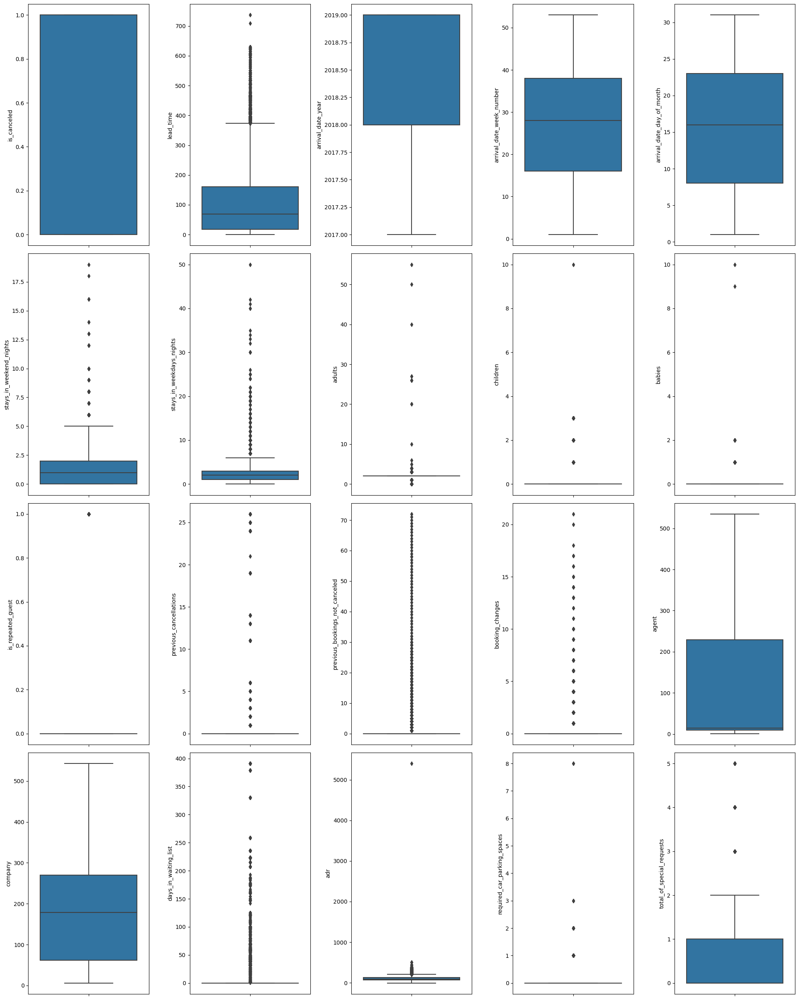

In [ ]:
# Membuat boxplot untuk setiap kolom numerik
plt.figure(figsize=(20, 25))
for i in range(0, len(nums)):
    plt.subplot(4, 5, i+1)
    sns.boxplot(y=df[nums[i]])
    plt.tight_layout()

### Boxplot
- Fitur is_canceled dan is_repeated_guest bernilai 0 atau 1, nanti harus diubah ke kategorikal.
- Fitur lead_time memiliki banyak outlier, nanti harus di handle.
- Fitur arrival_date_year juga merupakan kategori (tahun 2017, 2018, dan 2019), nanti harus diubah menjadi kategorikal.
- Fitur arrival_date_week_number dan arrival_date_day_of_month tidak memiliki outlier. Fitur lainnya banyak memiliki outlier.
- Fitur company akan dihilangkan karena didominasi oleh null value.

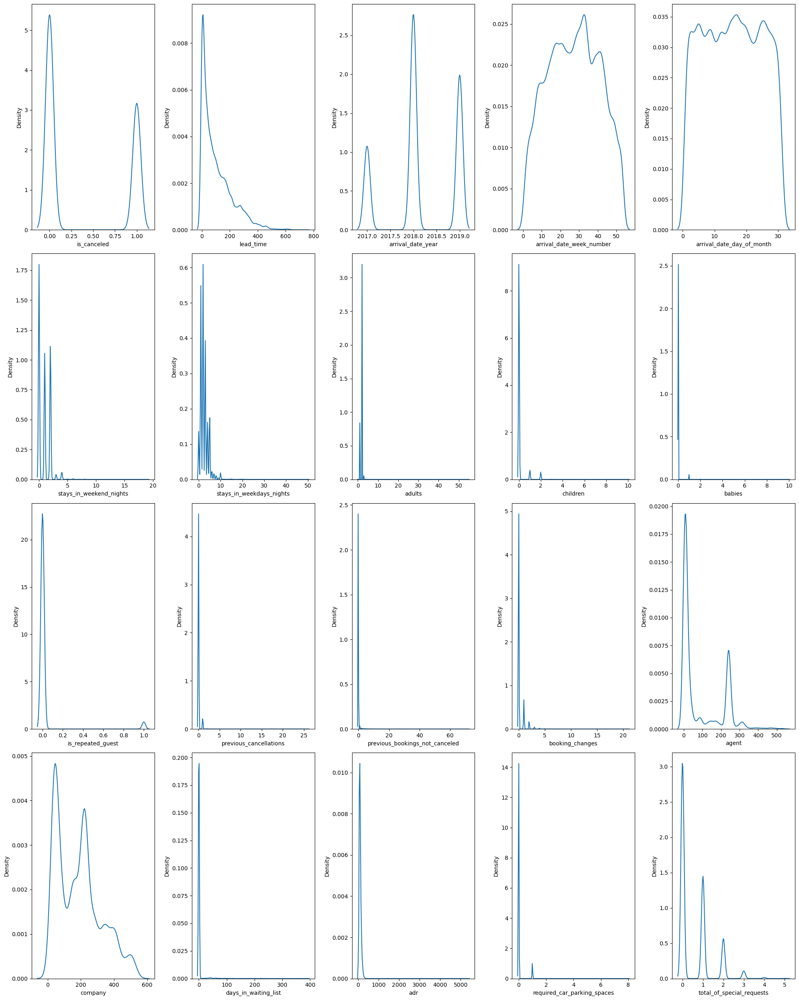

In [ ]:
# Individual Distplot/KDE Plot (Numerical)
plt.figure(figsize=(20, 25))
for i in range(0, len(nums)):
    plt.subplot(4, 5, i+1)
    sns.kdeplot(df[nums[i]])
    plt.xlabel(nums[i])
    plt.tight_layout()

### Displot
- Fitur is_canceled, arrival_date_year, is_repeated_guest, dan total_of_special_requests memiliki distribusi bimodal karena bertipe kategorikal.
- Fitur lead_time memiliki positively skewed.
- Fitur arrival_date_week_number dan arrival_date_day_of_month memiliki distribusi mendekati normal.

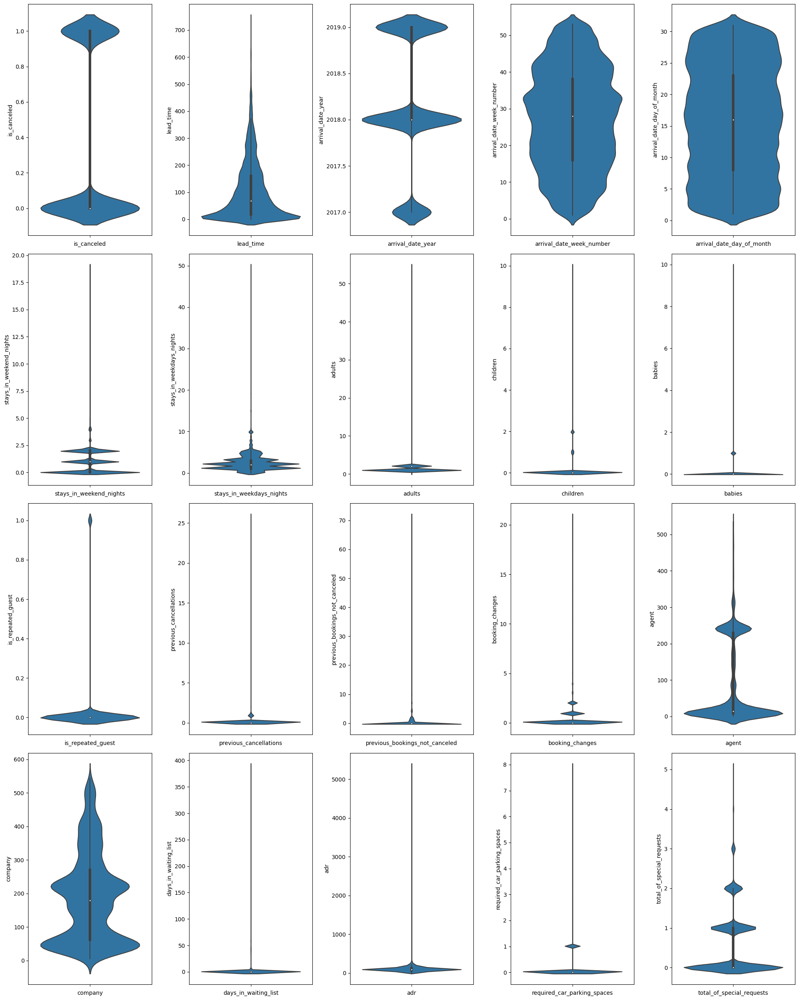

In [ ]:
# Individual Violin Plots (Numeric)
plt.figure(figsize=(20, 25))
for i in range(0, len(nums)):
    plt.subplot(4, 5, i+1)
    sns.violinplot(y=df[nums[i]])
    plt.xlabel(nums[i])
    plt.tight_layout()

### Violin PLot
- lead_time (jumlah hari antara saat reservasi dilakukan dan saat kedatangan)  di banyak 0 sampai 70 hari.
- arrival_date_year (tahun kedatangan) paling banyak di tahun 2018.
- required_car_parking_spaces (jumlah tempat parkir yang dibutuhkan oleh tamu) mayoritas 0 atau 1 space parkir.
- total_of_special_requests (jumlah permintaan khusus oleh tamu) paling banyak adalah tidak ada permintaan dan 1 permintaan.
- arrival_date_week_number (minggu ke berapa dalam tahun kedatangan) dan arrival_date_day_of_month (hari kedatangan dalam bulan) tersebar merata.
- Selebihnya banyak memiliki outlier yang harus dihandle.

### Individual Countplot (Categorical)

<Axes: xlabel='hotel', ylabel='count'>

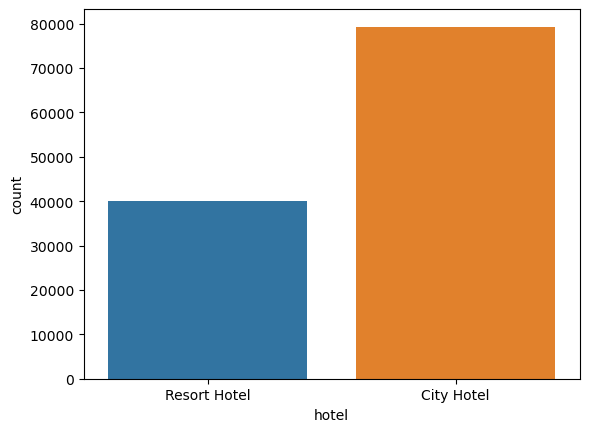

In [ ]:
sns.countplot(data=df, x='hotel')

City Hotel lebih diminati pengunjung daripada Resort Hotel, hampir 2 kali lipatnya.

<Axes: xlabel='is_canceled', ylabel='count'>

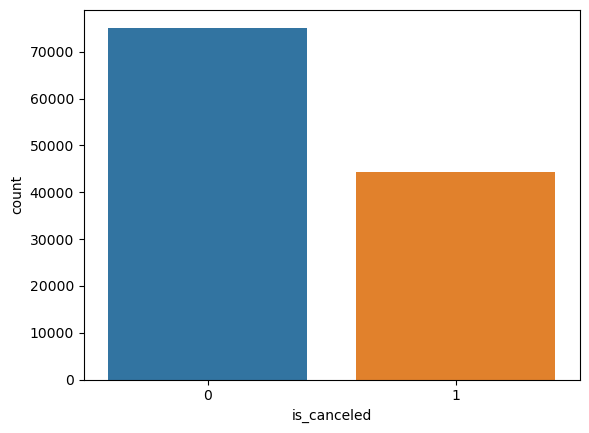

In [ ]:
sns.countplot(data=df, x='is_canceled')

Masih sangat banyak pengunjung yang melakukan pembatalan pemesanan hotel.

<Axes: xlabel='arrival_date_year', ylabel='count'>

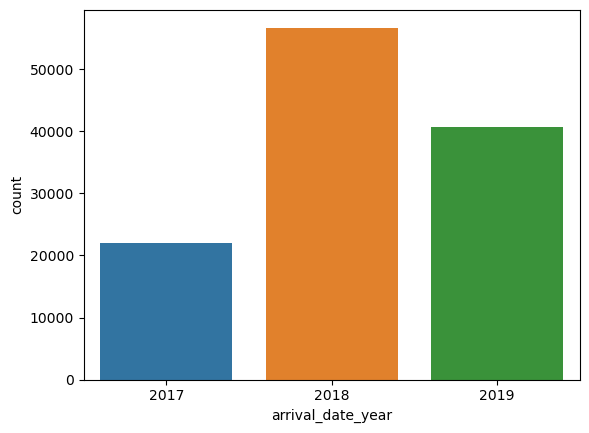

In [ ]:
sns.countplot(data=df, x='arrival_date_year')

Tahun kedatangan tiga tahun terakhir dari 2017 smapai 2019, paling tinggi pada 2018, diikuti tahun 2019 kemudian 2017.

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11]),
 [Text(0, 0, 'September'),
  Text(1, 0, 'October'),
  Text(2, 0, 'November'),
  Text(3, 0, 'December'),
  Text(4, 0, 'January'),
  Text(5, 0, 'February'),
  Text(6, 0, 'March'),
  Text(7, 0, 'April'),
  Text(8, 0, 'May'),
  Text(9, 0, 'June'),
  Text(10, 0, 'July'),
  Text(11, 0, 'August')])

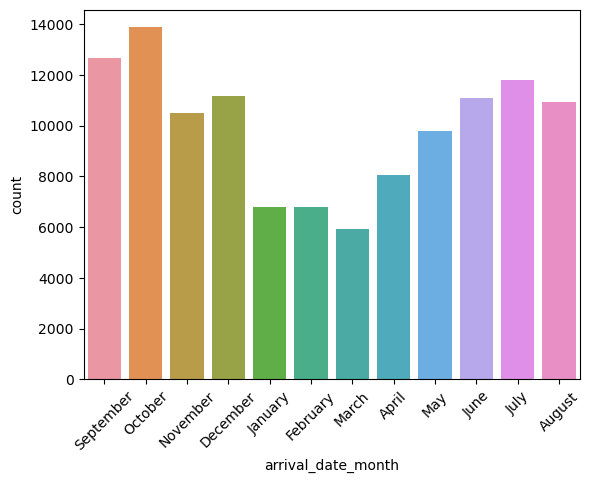

In [ ]:
sns.countplot(data=df, x='arrival_date_month')
plt.xticks(rotation=45)

Bulan kedatangan paling banyak terdapat pengunjung hotel adalah bulan Oktober, September, dan Juli.
Hal ini mungkin dikarenakan pada bulan tersebut terdapat event tertentu.

<Axes: xlabel='meal', ylabel='count'>

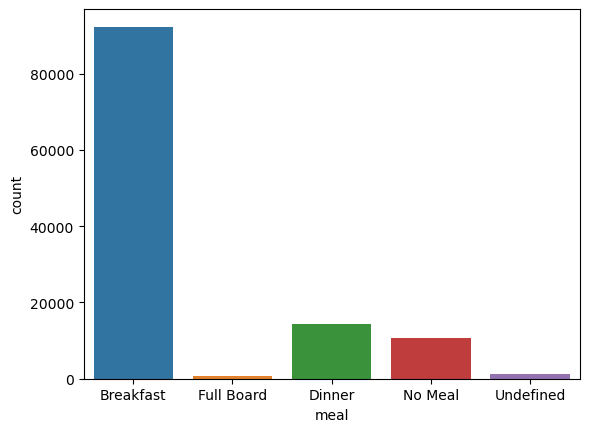

In [ ]:
sns.countplot(data=df, x='meal')

- Mayoritas tamu lebih memilih untuk hanya sarapan di hotel dan mungkin lebih suka menjelajahi opsi makan siang dan makan malam di luar hotel. Ini menunjukkan bahwa tamu ingin fleksibilitas untuk mencoba restoran dan kafe lokal selama sisa hari mereka di hotel.
- Undefined akan diganti menjadi Lunch di data preprocessing

(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 [Text(0, 0, 'Kota Denpasar'),
  Text(1, 0, 'Kabupaten Bangka'),
  Text(2, 0, 'Kota Yogyakarta'),
  Text(3, 0, 'Kota Batu'),
  Text(4, 0, 'Kabupaten Bandung'),
  Text(5, 0, 'Kabupaten Kepulauan Seribu'),
  Text(6, 0, 'Kota Malang'),
  Text(7, 0, 'Kabupaten Magelang'),
  Text(8, 0, 'Kota Jakarta Barat'),
  Text(9, 0, 'Kabupaten Belitung')])

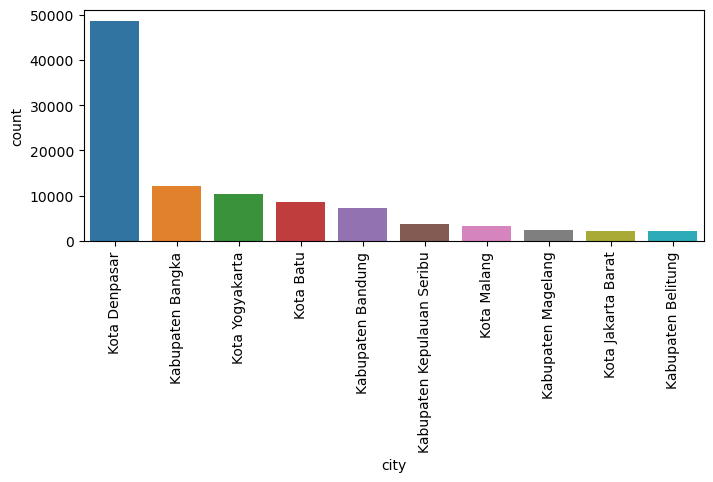

In [ ]:
# Hitung frekuensi masing-masing kota
city_counts = df['city'].value_counts()

# Pilih 10 kota dengan frekuensi tertinggi
top_10_cities = city_counts.nlargest(10).index

# Filter data untuk hanya menyertakan 10 kota tersebut
filtered_data_city = df[df['city'].isin(top_10_cities)]
sorted_data_city = filtered_data_city['city'].value_counts().nlargest(10).index

# Membuat countplot dengan data yang telah difilter
plt.figure(figsize=(8, 3))
sns.countplot(data=filtered_data_city, x='city', order=sorted_data_city)

# Memutar label sumbu x agar tidak tumpang tindih
plt.xticks(rotation=90)

Hotel di kota Denpasar paling banyak dikunjungi kemungkinan karena lokasinya yang strategis sebagai pusat administrasi dan bisnis di Bali, akses yang baik ke Bandara Internasional Ngurah Rai, dan fasilitas yang lengkap seperti pusat perbelanjaan dan rumah sakit. Hotel paling banyak dikunjungi kedua adalah di Kabupaten Bangka, mungkin karena keindahan pantainya serta kekayaan budaya dan sejarahnya. Sementara itu, di Yogyakarta, kunjungan ke hotel didorong oleh daya tarik budaya, wisata sejarah, dan keberadaan destinasi terkenal seperti Candi Borobudur dan Keraton Yogyakarta, serta keramahtamahan masyarakatnya.

(array([0, 1, 2, 3, 4, 5, 6, 7]),
 [Text(0, 0, 'Direct'),
  Text(1, 0, 'Corporate'),
  Text(2, 0, 'Online TA'),
  Text(3, 0, 'Offline TA/TO'),
  Text(4, 0, 'Complementary'),
  Text(5, 0, 'Groups'),
  Text(6, 0, 'Undefined'),
  Text(7, 0, 'Aviation')])

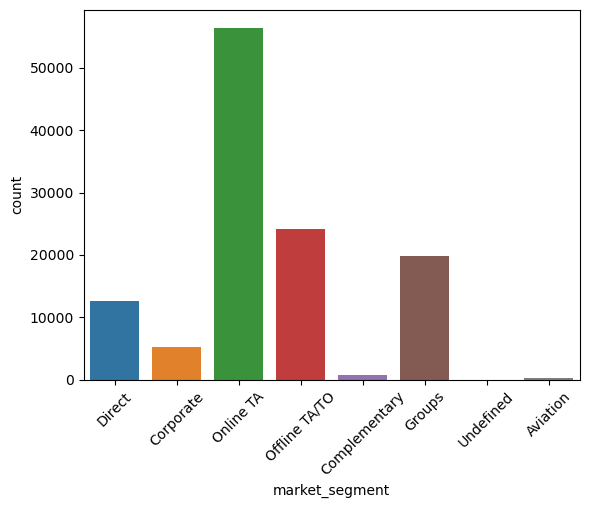

In [ ]:
sns.countplot(data=df, x='market_segment')
plt.xticks(rotation=45)

Dari sisi market_segment, mayoritas pemesanan berasal dari Online TA (Travel Agents), diikuti oleh agen perjalanan offline (TA/TO), dan grup wisata, menunjukkan preferensi wisatawan terhadap kemudahan dan fleksibilitas yang ditawarkan oleh layanan pemesanan online.

<Axes: xlabel='distribution_channel', ylabel='count'>

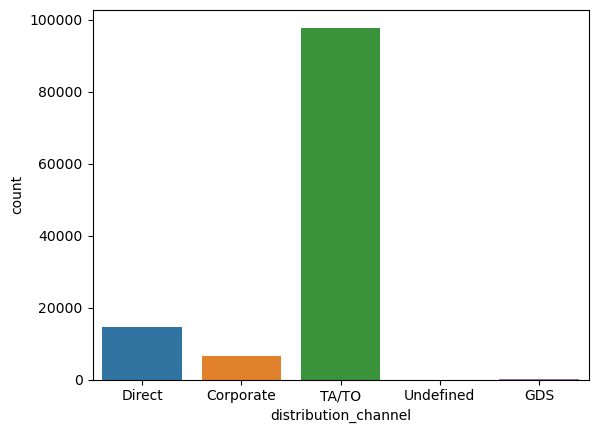

In [ ]:
sns.countplot(data=df, x='distribution_channel')

Dalam hal distribution_channel, sebagian besar pemesanan datang melalui TA/TO (Travel Agent/Tour Operator), diikuti oleh pemesanan langsung (direct), dan kemudian dari korporat (corporate), menunjukkan kepercayaan wisatawan pada agen perjalanan dan preferensi mereka untuk kemudahan pemesanan yang disediakan oleh saluran ini.

<Axes: xlabel='is_repeated_guest', ylabel='count'>

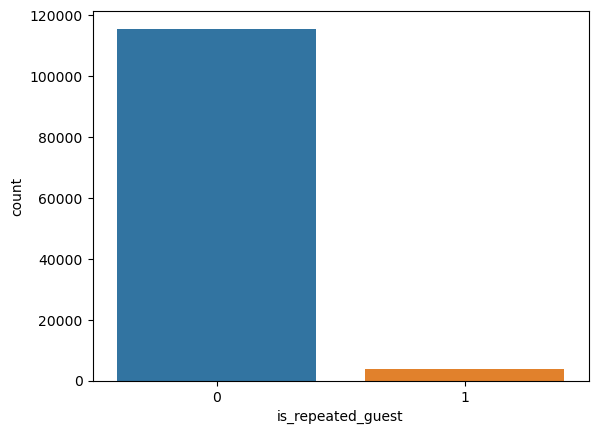

In [ ]:
sns.countplot(data=df, x='is_repeated_guest')

Mayoritas tamu merupakan tamu baru (is_repeated_guest mayoritas 0 dibandingkan 1), menunjukkan bahwa hotel-hotel ini banyak menarik pengunjung baru yang mungkin tertarik dengan keunikan dan daya tarik daerah ini.

<Axes: xlabel='deposit_type', ylabel='count'>

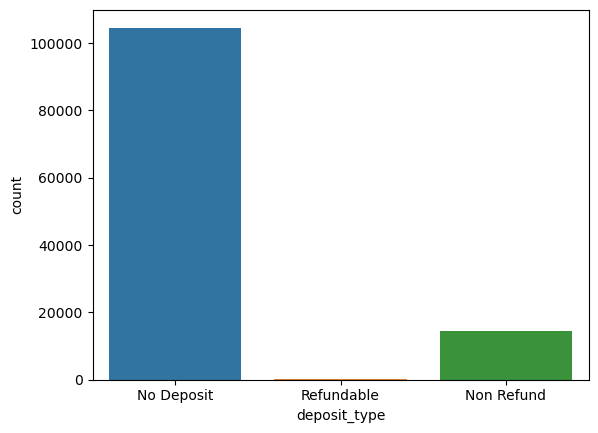

In [ ]:
sns.countplot(data=df, x='deposit_type')

Mayoritas untuk no deposit mungkin mencerminkan bahwa banyak tamu menginginkan fleksibilitas dalam perencanaan perjalanan mereka tanpa perlu mengikatkan uang di muka. Sementara itu, pilihan non_refund menunjukkan bahwa beberapa tamu lebih memilih harga lebih murah meskipun dengan risiko kehilangan uang deposit jika harus membatalkan atau mengubah rencana. Sedangkan opsi refundable yang jarang dipilih menunjukkan bahwa hanya sebagian kecil tamu yang memprioritaskan kemampuan untuk membatalkan reservasi tanpa risiko finansial.

(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 [Text(0, 0, '9.0'),
  Text(1, 0, '240.0'),
  Text(2, 0, '1.0'),
  Text(3, 0, '14.0'),
  Text(4, 0, '7.0'),
  Text(5, 0, '6.0'),
  Text(6, 0, '250.0'),
  Text(7, 0, '241.0'),
  Text(8, 0, '28.0'),
  Text(9, 0, '8.0')])

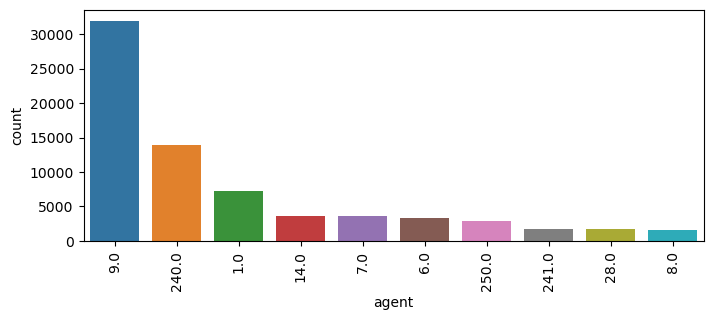

In [ ]:
# Hitung frekuensi masing-masing agent
agent_counts = df['agent'].value_counts()

# Pilih 10 agent dengan frekuensi tertinggi
top_10_agent = agent_counts.nlargest(10).index

# Filter data untuk hanya menyertakan 10 agent tersebut
filtered_data_agent = df[df['agent'].isin(top_10_agent)]
sorted_data_agent = filtered_data_agent['agent'].value_counts().nlargest(10).index

# Membuat countplot dengan data yang telah difilter
plt.figure(figsize=(8, 3))
sns.countplot(data=filtered_data_agent, x='agent', order=sorted_data_agent)

# Memutar label sumbu x agar tidak tumpang tindih
plt.xticks(rotation=90)

Agent dengan ID 9.0 menjadi pilihan utama tamu dalam melakukan reservasi hotel, diikuti oleh agent dengan ID 240.0 dan 1.0. Preferensi ini dapat mencerminkan reputasi atau hubungan yang baik antara tamu dan agen tersebut, mungkin karena agen tersebut memiliki pengetahuan yang baik tentang preferensi dan kebutuhan tamu mereka, atau karena mereka berhasil memberikan layanan yang memuaskan dalam pengalaman sebelumnya.

(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 [Text(0, 0, '40.0'),
  Text(1, 0, '223.0'),
  Text(2, 0, '67.0'),
  Text(3, 0, '45.0'),
  Text(4, 0, '153.0'),
  Text(5, 0, '174.0'),
  Text(6, 0, '219.0'),
  Text(7, 0, '281.0'),
  Text(8, 0, '154.0'),
  Text(9, 0, '405.0')])

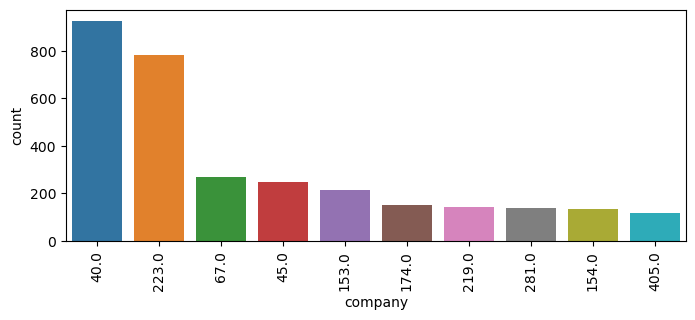

In [ ]:
# Hitung frekuensi masing-masing company
company_counts = df['company'].value_counts()

# Pilih 10 company dengan frekuensi tertinggi
top_10_company = company_counts.nlargest(10).index

# Filter data untuk hanya menyertakan 10 company tersebut
filtered_data_company = df[df['company'].isin(top_10_company)]
sorted_data_company = filtered_data_company['company'].value_counts().nlargest(10).index

# Membuat countplot dengan data yang telah difilter
plt.figure(figsize=(8, 3))
sns.countplot(data=filtered_data_company, x='company', order=sorted_data_company)

# Memutar label sumbu x agar tidak tumpang tindih
plt.xticks(rotation=90)

Perusahaan dengan ID 40.0 menjadi pilihan utama dalam melakukan reservasi hotel, diikuti oleh perusahaan dengan ID 223.0 dan 67.0. Preferensi ini mungkin mencerminkan kerja sama yang kuat antara hotel dan perusahaan-perusahaan ini, mungkin dalam bentuk kontrak bisnis atau program loyalitas yang disepakati.

<Axes: xlabel='customer_type', ylabel='count'>

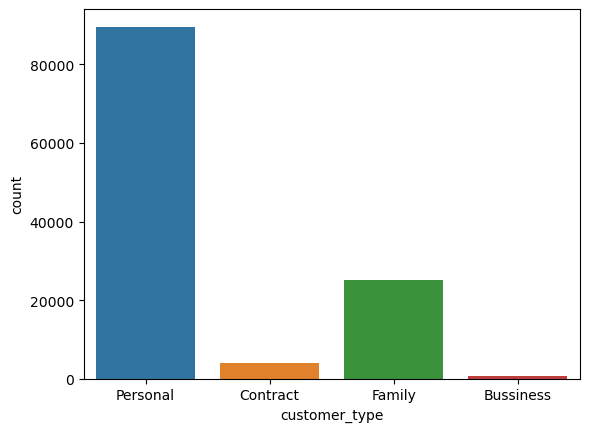

In [ ]:
sns.countplot(data=df, x='customer_type')

Customer_type yang paling banyak adalah personal, diikuti oleh family, contract, dan business. Preferensi ini mencerminkan variasi dalam jenis tamu yang menginap di hotel, dengan personal dan family mungkin merupakan segmen yang paling umum atau populer dalam pemesanan kamar hotel. Sementara itu, contract dan business menunjukkan bahwa hotel juga menarik tamu dari segmen bisnis dan perjanjian kontrak, yang dapat memberikan stabilitas dan penggunaan fasilitas hotel yang lebih konsisten dari waktu ke waktu.

<Axes: xlabel='reservation_status', ylabel='count'>

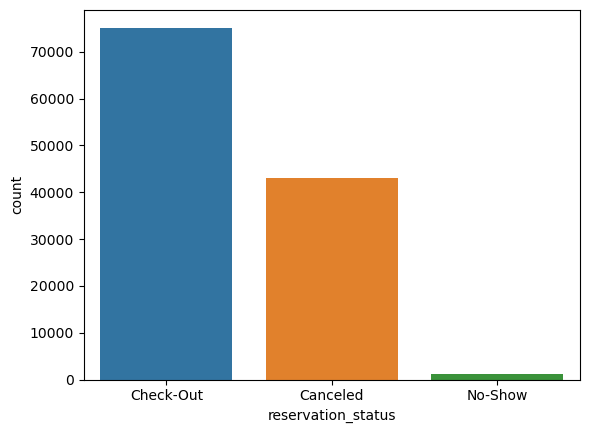

In [ ]:
sns.countplot(data=df, x='reservation_status')

Reservation_status yang paling banyak adalah check-out, yang menunjukkan bahwa sebagian besar reservasi tamu telah selesai dengan baik dan tamu telah meninggalkan hotel setelah periode menginap mereka. Diikuti oleh canceled, yang menunjukkan reservasi yang dibatalkan sebelum kedatangan tamu, dan no-show, yang mengindikasikan tamu yang tidak tiba tanpa memberi tahu hotel sebelumnya.

### Multivariate Analysis

<Axes: >

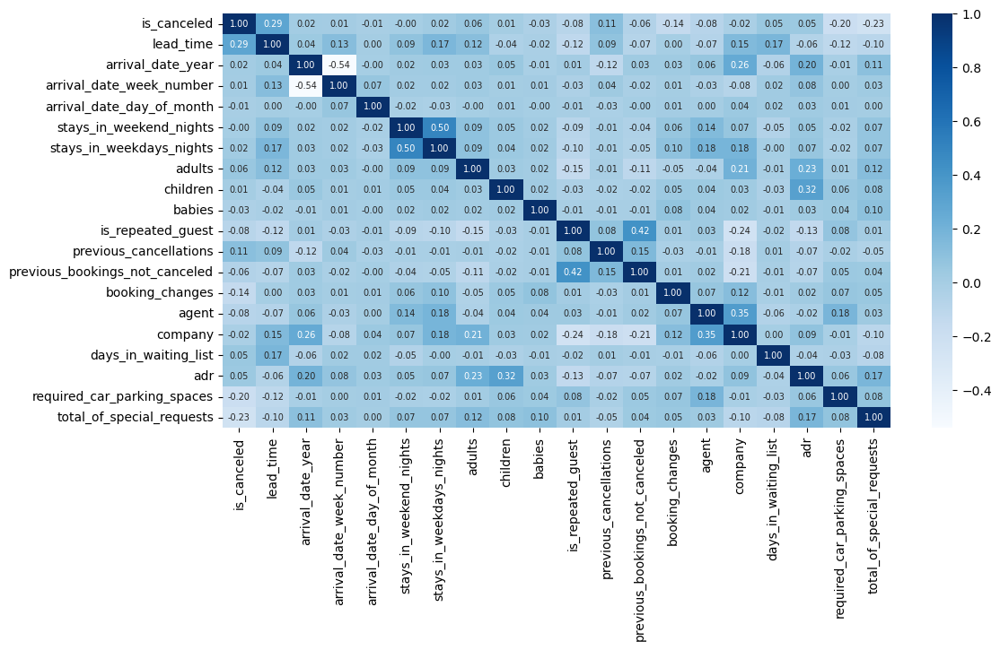

In [ ]:
plt.figure(figsize=(12, 6))
sns.heatmap(df[nums].corr(), annot=True, fmt='.2f', cmap='Blues', annot_kws={'fontsize': 7})

#### Skor korelasi setiap fitur
- Fitur target: is_canceled
- is_canceled dan lead_time berkorelasi positif lemah. Semakin lama rentang waktu pemesanan dan kedatangan maka semakin berpotensi untuk melakukan pembatalan pemesanan.
- is_canceled dan previous_cancellations berkorelasi positif lemah. Semakin banyak melakukan pembatalan di pemesanan sebelum-sebelumnya maka di pemesanan berikutnya berpotensi akan dibatalkan kembali.
- is_repeated_guest dan previous_bookings_not_canceled berkorelasi positif cukup kuat. Semakin banyak jumlah pemesanan sebelumnya yang tidak dibatalkan oleh tamu maka tamu tersebut semakin berpotensi akan melakukan pemesanan kembali.
- adults dan adr berkorelasi positif lemah. Ada kecenderungan bahwa semakin banyak jumlah orang dewasa dalam pemesanan, maka akan ada sedikit peningkatan dalam nilai adr (harga harian rata-rata). Namun, jumlah orang dewasa dalam pemesanan hanya memberikan kontribusi kecil terhadap variasi dalam nilai adr.
- children dan adr berkorelasi positif sedang. Ada kecenderungan bahwa semakin banyak jumlah anak-anak dalam pemesanan, ada sedikit peningkatan dalam nilai adr (harga harian rata-rata).
- adr dan total_of_special_requests berkorelasi positif lemah. Ada sedikit kecenderungan bahwa semakin banyak jumlah permintaan khusus oleh tamu, ada sedikit peningkatan dalam nilai adr. Namun, hubungan ini tidak terlalu kuat, yang berarti bahwa pengaruh total permintaan khusus terhadap nilai adr tidak signifikan.
- Nantinya ketika kolom kategorikal sudah di ubah ke numerik mungkin ada insight/informasi baru.

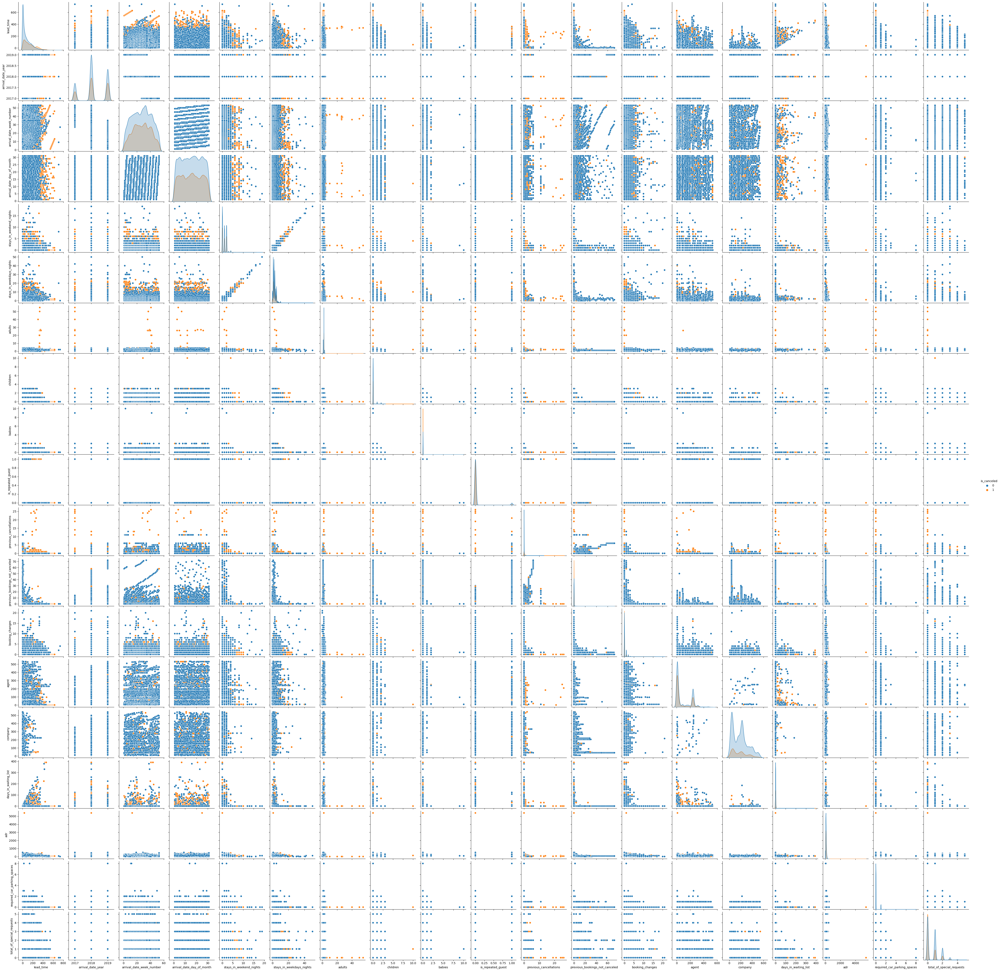

In [ ]:
# Pair Plots (Numeric)

sns.pairplot(df[nums], diag_kind='kde', hue='is_canceled')

Tidak ditemukan scatter plot dimana kedua warna terpisah dengan baik.

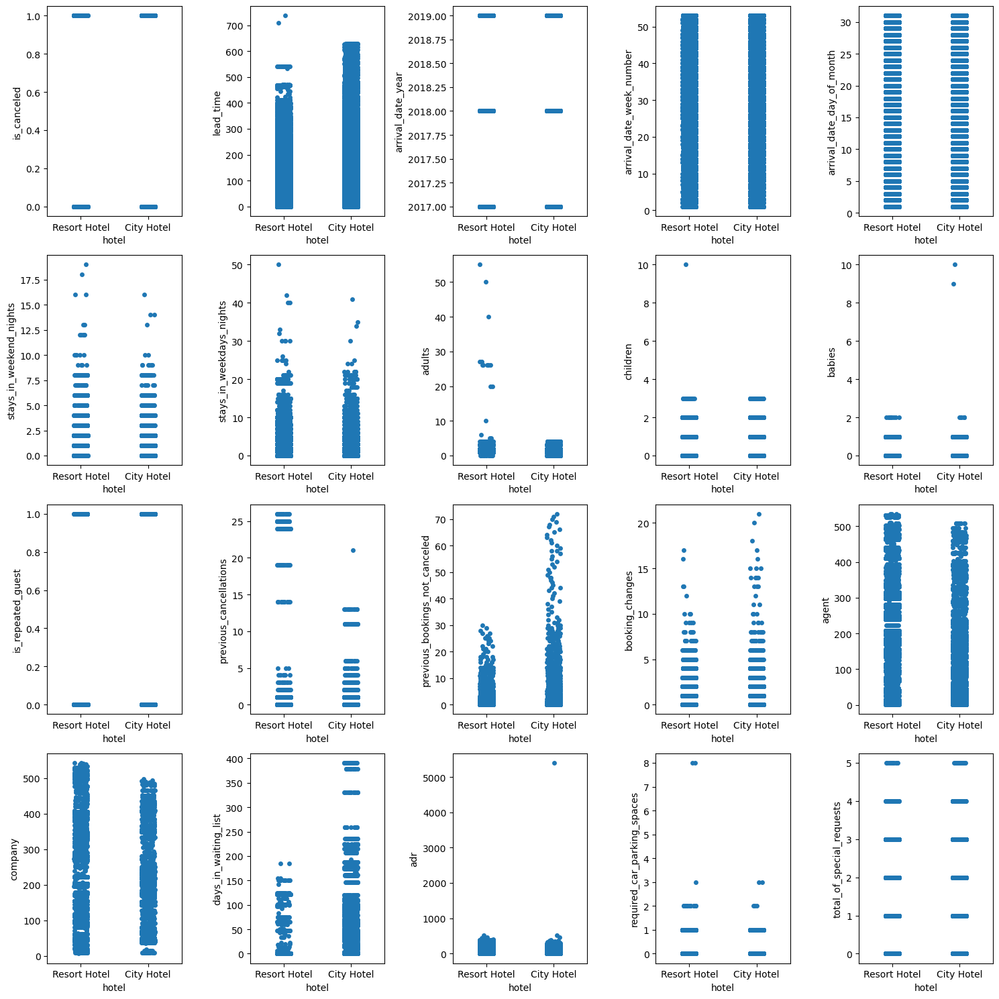

In [ ]:
fig = plt.figure(figsize=(15, 15))
for i in range(0, len(nums)): # untuk setiap kolom numerik
    ax = fig.add_subplot(4, 5, i+1) # kita set posisi catplot/stripplotnya di layout
    sns.stripplot(ax=ax, data=df, x='hotel', y=nums[i]) # gambar catplot/stripplotnya
    plt.tight_layout()

- Mayoritas hotel tidak berpengaruh karena sama rata.
- Resort hotel memiliki lead_time yang lebih pendek daripada City hotel.
- Resort hotel memiliki stays_in_weekend_nights yang lebih banyak daripada City hotel namun perbedaannya tidak signifikan.
- Adults (orang dewasa) lebih minat memesan di Resort Hotel daripada City Hotel.
- Resort hotel memiliki jumlah pembatalan di atas 15 kali, sedangkan City hotel kurang dari 15 kali.
- City hotel memiliki riwayat tanpa pembatalan pada pemesanan sebelumnya lebih tinggi daripada resort hotel.
- City hotel memiliki jumlah hari pemesanan berada dalam daftar tunggu (waiting list) yang sangat tinggi hingga mencapai 400 hari, sedangkan Resort Hotel hingga 200 hari.

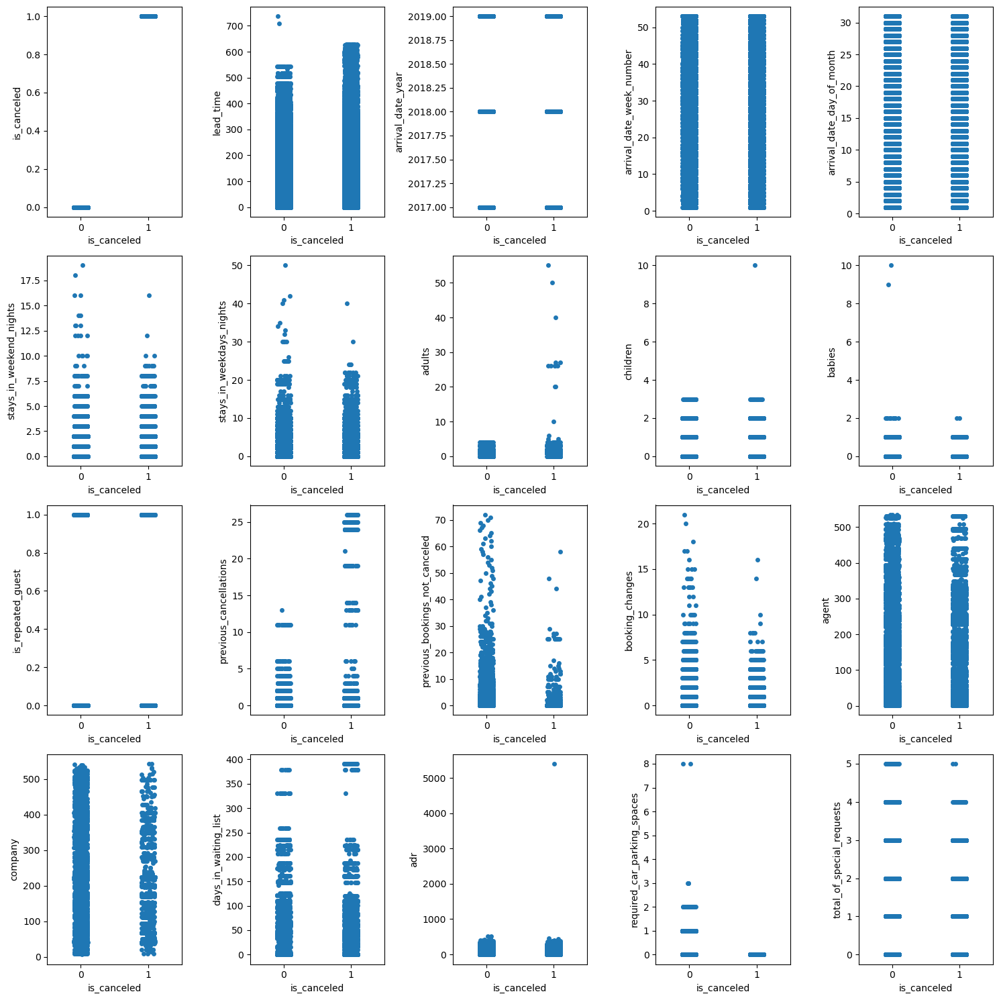

In [ ]:
fig = plt.figure(figsize=(15, 15))
for i in range(0, len(nums)): # untuk setiap kolom numerik
    ax = fig.add_subplot(4, 5, i+1) # kita set posisi catplot/stripplotnya di layout
    sns.stripplot(ax=ax, data=df, x='is_canceled', y=nums[i]) # gambar catplot/stripplotnya
    plt.tight_layout()

- Pembatalan lebih banyak terjadi ketika lead_time semakin tinggi.
- Pembatalan terjadi ketika pemesanan untuk jumlah orang dewasa cukup tinggi (rombongan).
- Pembatalan lebih sering terjadi ketika tamu pernah melakukan pembatalan sebelumnya.
- Pembatalan lebih sering tidak terjadi ketika tamu tidak melakukan pembatalan di pemesanan sebelumnya.
- Pembatalan tidak terjadi karena tamu banyak melakukan perubahan pemesanan.

# Data Preprocessing

## Handle Missing Value

In [ ]:
df.isna().sum()

hotel                                  0
is_canceled                            0
lead_time                              0
arrival_date_year                      0
arrival_date_month                     0
arrival_date_week_number               0
arrival_date_day_of_month              0
stays_in_weekend_nights                0
stays_in_weekdays_nights               0
adults                                 0
children                               4
babies                                 0
meal                                   0
city                                 488
market_segment                         0
distribution_channel                   0
is_repeated_guest                      0
previous_cancellations                 0
previous_bookings_not_canceled         0
booking_changes                        0
deposit_type                           0
agent                              16340
company                           112593
days_in_waiting_list                   0
customer_type   

In [ ]:
# Mengisi nilai null fitur children menggunakan median
df['children'].fillna(df['children'].median(), inplace=True)

# Mengisi nilai null kategorikal menggunakan modus
df['city'].fillna(df['city'].mode()[0], inplace=True)

# Mengisi fitur agent menggunakan 0
df['agent'].fillna(0.0, inplace=True)

# Drop fitur company karena data di dominasi dengan nilai null
df.drop(['company'], axis=1, inplace=True)

In [ ]:
df.isna().sum()

hotel                             0
is_canceled                       0
lead_time                         0
arrival_date_year                 0
arrival_date_month                0
arrival_date_week_number          0
arrival_date_day_of_month         0
stays_in_weekend_nights           0
stays_in_weekdays_nights          0
adults                            0
children                          0
babies                            0
meal                              0
city                              0
market_segment                    0
distribution_channel              0
is_repeated_guest                 0
previous_cancellations            0
previous_bookings_not_canceled    0
booking_changes                   0
deposit_type                      0
agent                             0
days_in_waiting_list              0
customer_type                     0
adr                               0
required_car_parking_spaces       0
total_of_special_requests         0
reservation_status          

## Handle Duplicated Data

Tidak melakukan handling duplikat karena tidak memiliki fitur ID yang bernilai unik yang dapat membantu identifikasi adanya duplikat data.

## Mengganti value yang tidak sesuai

In [ ]:
df['meal'].unique()

array(['Breakfast', 'Full Board', 'Dinner', 'No Meal', 'Undefined'],
      dtype=object)

In [ ]:
df['meal'] = df['meal'].replace('Undefined', 'Lunch')

<Axes: xlabel='meal', ylabel='count'>

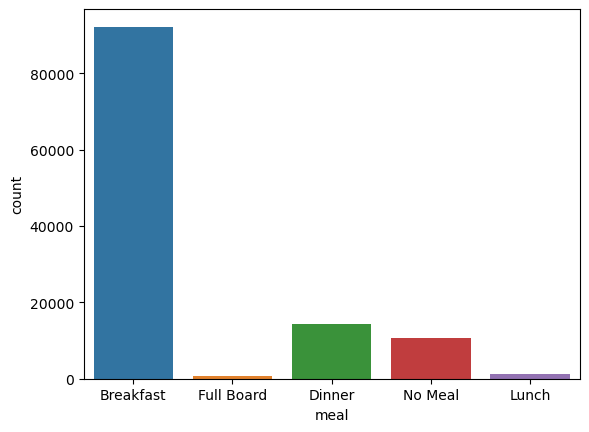

In [ ]:
sns.countplot(data=df, x='meal')

Mengganti Undefined menjadi Lunch karena belum ada di jenis meal yang tersedia.

## Membuang data yang tidak diperlukan

In [ ]:
df['total_tamu'] = df['adults'] + df['children'] + df['babies']

In [ ]:
# Before
df['total_tamu'].value_counts()

total_tamu
2.0     82051
1.0     22581
3.0     10495
4.0      3929
0.0       180
5.0       137
26.0        5
12.0        2
27.0        2
20.0        2
10.0        2
40.0        1
50.0        1
55.0        1
6.0         1
Name: count, dtype: int64

In [ ]:
# Membuang baris dengan total_tamu adalah 0
df = df[df['total_tamu'] > 0]

In [ ]:
# After
df['total_tamu'].value_counts()

total_tamu
2.0     82051
1.0     22581
3.0     10495
4.0      3929
5.0       137
26.0        5
12.0        2
27.0        2
20.0        2
10.0        2
40.0        1
50.0        1
55.0        1
6.0         1
Name: count, dtype: int64

In [ ]:
# Menghapus kembali kolom total_tamu setelah selesai digunakan
df = df.drop(columns=['total_tamu'])

Terdapat 180 data invalid atau pemesanan dengan jumlah tamu adalah nol.

# Tahap 2

## Handling Outlier

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 119210 entries, 0 to 119389
Data columns (total 28 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           119210 non-null  object 
 1   is_canceled                     119210 non-null  int64  
 2   lead_time                       119210 non-null  int64  
 3   arrival_date_year               119210 non-null  int64  
 4   arrival_date_month              119210 non-null  object 
 5   arrival_date_week_number        119210 non-null  int64  
 6   arrival_date_day_of_month       119210 non-null  int64  
 7   stays_in_weekend_nights         119210 non-null  int64  
 8   stays_in_weekdays_nights        119210 non-null  int64  
 9   adults                          119210 non-null  int64  
 10  children                        119210 non-null  float64
 11  babies                          119210 non-null  int64  
 12  meal                 

In [ ]:
df_pre = df.copy()

In [ ]:
from scipy import stats

In [ ]:
# z-score outliers handling
def handle_outliers_zscore(data, columns, threshold=1.5, plot=False):
    filtered_entries = np.array([True] * len(data))
    outliers_entries = np.array([True] * len(data))

    for column in columns:
        z_scores = np.abs((data[column] - data[column].mean()) / data[column].std())
        filtered = (z_scores < threshold)
        filtered_entries = np.logical_and(filtered, filtered_entries)
        outliers_entries = ~filtered_entries
        filtered_data = data[filtered_entries]
        outliers_data = data[outliers_entries]

    filtered_data.reset_index(drop=True, inplace=True)
    outliers_data.reset_index(drop=True, inplace=True)

    if plot == True:
        for column in columns:
            fig, ax = plt.subplots(1, 2, figsize=(8, 4))
            ax[0].set_title(f'Before Outliers in {column}')
            sns.boxplot(data[column], ax=ax[0])
            ax[1].set_title(f'After Outliers in {column}')
            sns.boxplot(filtered_data[column], ax=ax[1])
            plt.tight_layout()
            plt.show()

    data_size = data.shape[0]
    filtered_size = filtered_data.shape[0]
    outliers_size = outliers_data.shape[0]
    pct_outliers = round((outliers_size/data_size)*100, 2)

    result = pd.Series(data=[data_size, filtered_size, outliers_size, pct_outliers],
                       index=['Before', 'After', 'Outliers', '% Outliers'])
    print(result, '\n')

    return filtered_data, outliers_data

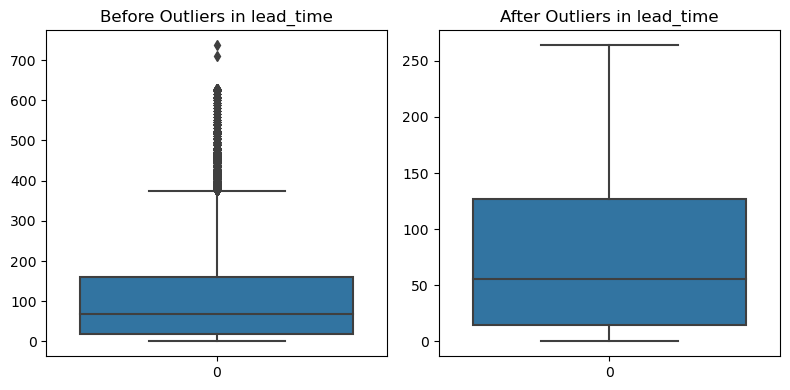

Before        119210.00
After         107194.00
Outliers       12016.00
% Outliers        10.08
dtype: float64 



In [ ]:
outlier_columns =  ['lead_time']
df_pre, residu = handle_outliers_zscore(df_pre, outlier_columns, threshold=1.5, plot=True)

<Axes: xlabel='lead_time', ylabel='Density'>

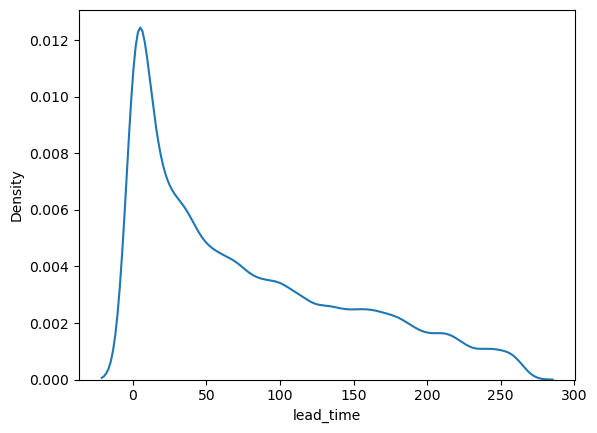

In [ ]:
# distribusi lead_time (nilai asli)
sns.kdeplot(df_pre['lead_time'])

Distribusi masih long right skew.

## Feature Transformation

<Axes: xlabel='lead_time', ylabel='Density'>

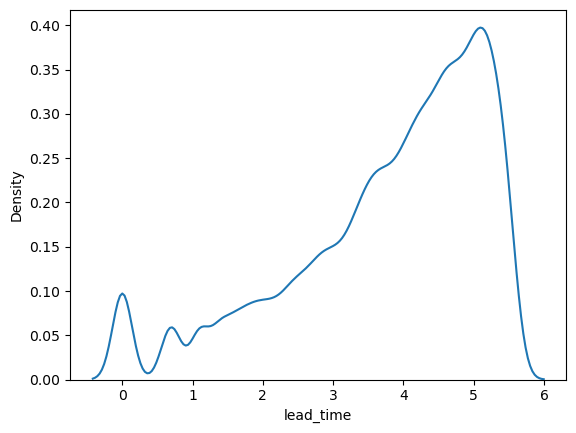

In [ ]:
# distribusi lead_time (setelah log transformation)
sns.kdeplot(np.log(df_pre['lead_time']))

Lebih mendekati distribusi normal setelah dilakukan log transformation.

### Membuat tabel agregat yang menunjukan perbandingan jumlah pemesanan hotel setiap bulannya berdasarkan jenis hotel

In [ ]:
# Filter data untuk tahun 2017, 2018, dan 2019
df_filtered = df_pre[df_pre['arrival_date_year'].isin([2017, 2018, 2019])]

# Membuat pivot table untuk jumlah pemesanan berdasarkan tahun, bulan, dan jenis hotel
agg_table = pd.pivot_table(
    df_filtered,
    values='is_canceled',
    index=['arrival_date_month'],
    columns=['arrival_date_year', 'hotel'],
    aggfunc='count',
    fill_value=0
)

# Mengatur ulang indeks untuk menampilkan bulan dalam urutan yang benar
order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
agg_table = agg_table.reindex(order, axis=0)

# Reset indeks untuk mempermudah plotting
agg_table = agg_table.reset_index()

In [ ]:
agg_table

arrival_date_year arrival_date_month       2017                    2018  \
hotel                                City Hotel Resort Hotel City Hotel   
0                            January       1233         1071       2549   
1                           February       1616         1262       2143   
2                              March          0            0       1364   
3                              April          0            0       2365   
4                                May          0            0       2949   
5                               June          0            0       3275   
6                               July          0            0       3112   
7                             August          0            0       3559   
8                          September        865         1358       2785   
9                            October       1803         1394       3033   
10                          November       2844         1467       3036   
11                          December       2922         1298       3404   

arrival_date_year                    2019               
hotel             Resort Hotel City Hotel Resort Hotel  
0                         1290          0            0  
1                         1357          0            0  
2                          883       2239         1298  
3                         1517       2491         1570  
4                         1775       3248         1460  
5                         1849       3682         1667  
6                         1738       4190         1511  
7                         1237       3582         1331  
8                         1345       2868         1577  
9                         1595       2741         1645  
10                        1174          0            0  
11                        1627          0            0

- Nilai 0 menunjukkan tidak ada pemesanan pada bulan dan tahun tersebut.

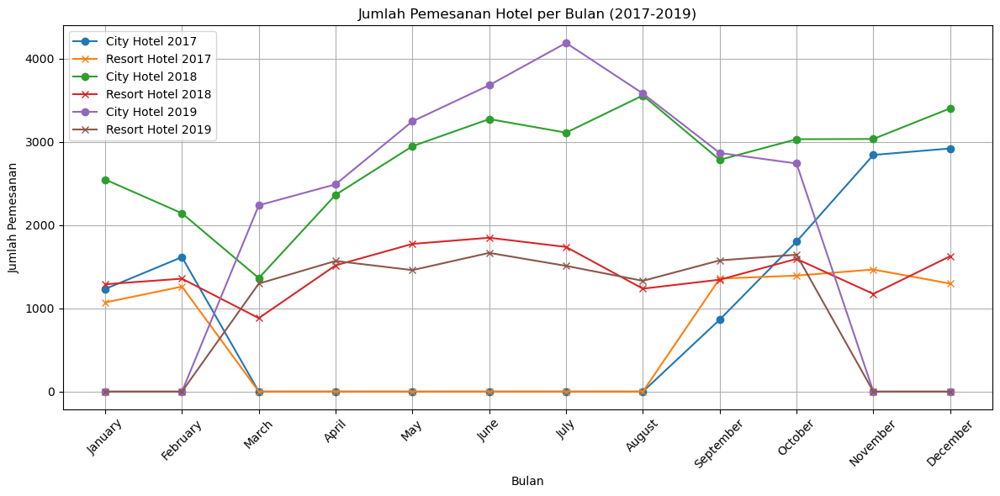

In [ ]:
plt.figure(figsize=(12, 6))

for year in [2017, 2018, 2019]:
    plt.plot(agg_table['arrival_date_month'], agg_table[(year, 'City Hotel')], marker='o', label=f'City Hotel {year}')
    plt.plot(agg_table['arrival_date_month'], agg_table[(year, 'Resort Hotel')], marker='x', label=f'Resort Hotel {year}')

plt.title('Jumlah Pemesanan Hotel per Bulan (2017-2019)')
plt.xlabel('Bulan')
plt.ylabel('Jumlah Pemesanan')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()

## Scaling (Normalisasi)

In [ ]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler

In [ ]:
df_norm = df_pre.copy()

In [ ]:
cols_to_normalize = ['lead_time', 'adr']

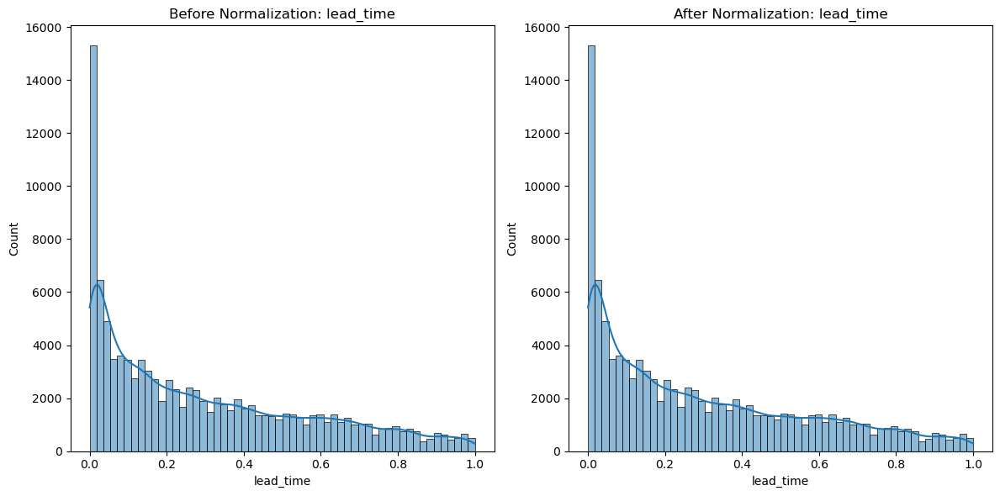

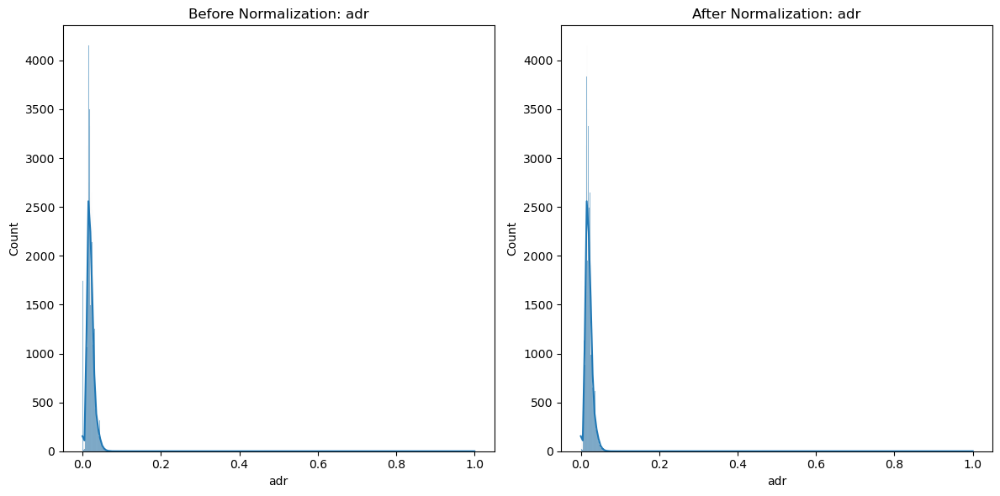

In [ ]:
def normalize_data_minmax(data, columns):
    scaler = MinMaxScaler()
    data[columns] = scaler.fit_transform(data[columns])
    return data

df_normalized = normalize_data_minmax(df_norm, cols_to_normalize)

# Visualisasi sebelum dan sesudah normalisasi
for column in cols_to_normalize:
    fig, ax = plt.subplots(1, 2, figsize=(12, 6))
    ax[0].set_title(f'Before Normalization: {column}')
    sns.histplot(df_normalized[column], kde=True, ax=ax[0])
    ax[1].set_title(f'After Normalization: {column}')
    sns.histplot(df_normalized[column], kde=True, ax=ax[1])
    plt.tight_layout()
    plt.show()

### Mengurutkan data berdasarkan bulan

In [ ]:
# Urutan bulan dalam setahun
bulan_order = ['January', 'February', 'March', 'April', 'May', 'June',
               'July', 'August', 'September', 'October', 'November', 'December']

# Mengubah kolom 'arrival_date_month' menjadi tipe kategori dengan urutan yang ditentukan
df_normalized['arrival_date_month'] = pd.Categorical(df_normalized['arrival_date_month'], categories=bulan_order, ordered=True)

# Mengurutkan data berdasarkan kolom 'arrival_date_month'
df_sorted = df_normalized.sort_values('arrival_date_month')

In [ ]:
df_sorted

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_weekdays_nights,adults,...,previous_bookings_not_canceled,booking_changes,deposit_type,agent,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status
54447,City Hotel,1,0.071970,2018,January,45,4,0,1,2,...,0,0,No Deposit,9.0,0,Personal,0.025226,0,1,Canceled
54493,City Hotel,1,0.359848,2018,January,45,5,0,1,1,...,0,0,No Deposit,0.0,0,Family,0.015053,0,0,Canceled
54494,City Hotel,1,0.359848,2018,January,45,5,0,1,1,...,0,0,No Deposit,0.0,0,Family,0.015053,0,0,Canceled
54495,City Hotel,1,0.359848,2018,January,45,5,0,1,1,...,0,1,No Deposit,0.0,0,Family,0.015053,0,0,Canceled
54496,City Hotel,1,0.359848,2018,January,45,5,0,1,1,...,0,0,No Deposit,0.0,0,Family,0.015053,0,0,Canceled
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42647,City Hotel,0,0.272727,2017,December,44,28,0,3,2,...,0,0,No Deposit,37.0,58,Family,0.017026,0,0,Check-Out
42646,City Hotel,0,0.272727,2017,December,44,28,0,3,2,...,0,0,No Deposit,37.0,58,Family,0.017026,0,0,Check-Out
23781,Resort Hotel,1,0.018939,2018,December,42,12,0,1,1,...,2,0,No Deposit,0.0,0,Personal,0.016162,0,0,Canceled
42644,City Hotel,0,0.272727,2017,December,44,28,0,3,1,...,0,1,No Deposit,37.0,58,Family,0.015114,0,0,Check-Out


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11]),
 [Text(0, 0, 'January'),
  Text(1, 0, 'February'),
  Text(2, 0, 'March'),
  Text(3, 0, 'April'),
  Text(4, 0, 'May'),
  Text(5, 0, 'June'),
  Text(6, 0, 'July'),
  Text(7, 0, 'August'),
  Text(8, 0, 'September'),
  Text(9, 0, 'October'),
  Text(10, 0, 'November'),
  Text(11, 0, 'December')])

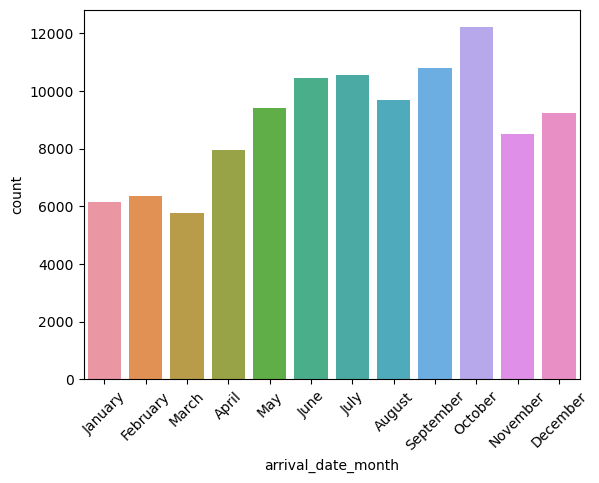

In [ ]:
sns.countplot(data=df_sorted, x='arrival_date_month')
plt.xticks(rotation=45)

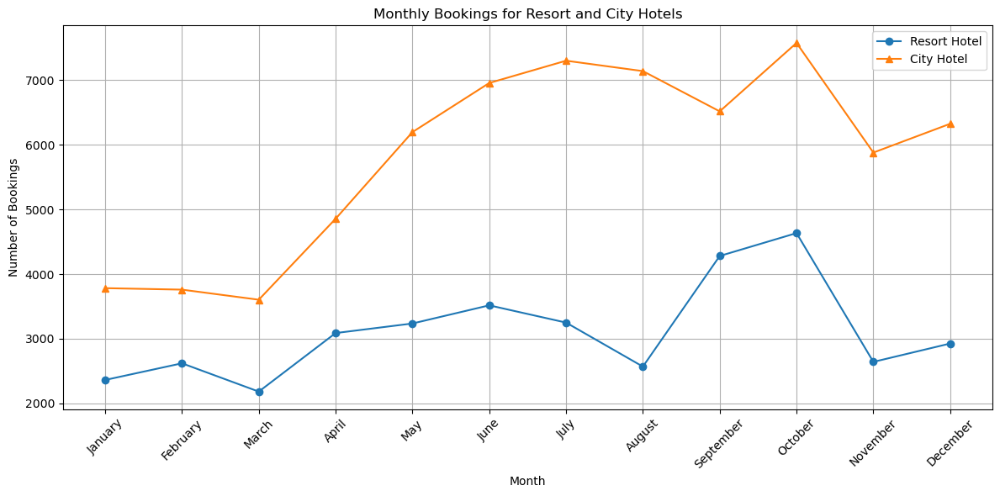

In [ ]:
# Agregasi data untuk mendapatkan jumlah pemesanan per bulan berdasarkan jenis hotel
agg_data = df_sorted.groupby(['arrival_date_month', 'hotel']).size().reset_index(name='num_bookings')

# Membuat pivot table
pivot_table = agg_data.pivot_table(index='arrival_date_month', columns='hotel', values='num_bookings', fill_value=0)

# Urutkan pivot table berdasarkan bulan
pivot_table = pivot_table.reindex(bulan_order)

# Plot garis untuk memvisualisasikan data
plt.figure(figsize=(12, 6))
plt.plot(pivot_table.index, pivot_table['Resort Hotel'], marker='o', label='Resort Hotel')
plt.plot(pivot_table.index, pivot_table['City Hotel'], marker='^', label='City Hotel')

plt.xlabel('Month')
plt.ylabel('Number of Bookings')
plt.title('Monthly Bookings for Resort and City Hotels')
plt.legend()
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

## Interpretasi

1. City Hotel:
- Januari hingga Maret: Jumlah pemesanan stabil dengan sedikit penurunan pada bulan Maret. Ini bisa disebabkan oleh liburan akhir tahun yang sudah berakhir dan periode awal tahun yang biasanya lebih tenang.
- April: Terdapat peningkatan signifikan dalam pemesanan, kemungkinan terkait dengan libur panjang Paskah atau hari libur nasional lainnya.
- Mei hingga Agustus: Jumlah pemesanan terus meningkat, mencapai puncaknya pada bulan Juli. Ini berkaitan dengan musim liburan sekolah di Indonesia yang berlangsung dari akhir Juni hingga awal Juli, serta libur Lebaran yang sering jatuh antara Mei dan Juni.
- September hingga Oktober: Meskipun ada sedikit penurunan pada bulan September, pemesanan kembali meningkat pada bulan Oktober.
- November dan Desember: Penurunan terjadi pada bulan November, namun pemesanan meningkat kembali pada bulan Desember. Peningkatan ini kemungkinan disebabkan oleh liburan Natal dan akhir tahun.

2. Resort Hotel:
- Januari hingga Maret: Jumlah pemesanan relatif stabil dengan sedikit penurunan pada bulan Maret. Ini mencerminkan pola yang mirip dengan City Hotel.
- April: Ada peningkatan pemesanan, meskipun tidak sebesar di City Hotel, yang mungkin terkait dengan libur panjang Paskah atau hari libur nasional lainnya.
- Mei hingga Agustus: Pemesanan meningkat, terutama pada bulan Juni dan Juli, yang menunjukkan dampak dari liburan sekolah dan libur Lebaran. Namun, terdapat penurunan pada bulan Agustus yang mungkin disebabkan oleh berakhirnya libur sekolah.
- September hingga Oktober: Peningkatan signifikan terlihat pada bulan September dan Oktober, yang bisa dipengaruhi oleh libur Idul Adha dan cuti bersama.
- November dan Desember: Pemesanan menurun pada bulan November tetapi meningkat kembali pada bulan Desember, yang mencerminkan tren liburan Natal dan akhir tahun.

# Tahap 3

### Membuat kolom baru yang berisi total durasi menginap

In [ ]:
# Tambahkan kolom total_stay_duration
df_sorted['total_stay_duration'] = df_sorted['stays_in_weekend_nights'] + df_sorted['stays_in_weekdays_nights']

In [ ]:
df_sorted.sample(5)

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_weekdays_nights,adults,...,booking_changes,deposit_type,agent,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,total_stay_duration
85952,City Hotel,0,0.007576,2018,November,36,2,0,1,2,...,0,No Deposit,9.0,0,Personal,0.047237,1,1,Check-Out,1
101521,City Hotel,0,0.564394,2019,July,21,27,2,1,2,...,0,No Deposit,9.0,0,Personal,0.021896,0,0,Check-Out,3
82945,City Hotel,0,0.359848,2018,September,29,15,2,2,2,...,0,No Deposit,83.0,0,Personal,0.015896,0,0,Check-Out,4
50688,City Hotel,1,0.462121,2018,September,31,27,0,1,2,...,0,No Deposit,9.0,0,Personal,0.023654,0,0,Canceled,1
52655,City Hotel,1,0.189394,2018,November,39,24,2,4,2,...,0,No Deposit,14.0,0,Personal,0.028148,0,3,Canceled,6


### Mengelompokkan durasi menginap menjadi 3 jenis

In [ ]:
# Definisikan fungsi untuk mengelompokkan nilai
def group_stay_duration(duration):
    if duration <= 2:
        return 'Short Stay'
    elif duration <= 4:
        return 'Medium Stay'
    else:
        return 'Long Stay'

# Terapkan fungsi untuk membuat kolom baru dengan kelompok nilai
df_sorted['stay_duration_group'] = df_sorted['total_stay_duration'].apply(group_stay_duration)

In [ ]:
df_sorted.sample(5)

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_weekdays_nights,adults,...,deposit_type,agent,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,total_stay_duration,stay_duration_group
90335,City Hotel,0,0.056818,2018,January,46,8,0,3,1,...,No Deposit,7.0,0,Personal,0.025392,0,1,Check-Out,3,Medium Stay
94540,City Hotel,0,0.034091,2019,April,6,10,2,2,2,...,No Deposit,9.0,0,Personal,0.019825,0,0,Check-Out,4,Medium Stay
47494,City Hotel,1,0.390152,2018,July,19,5,2,5,2,...,No Deposit,14.0,0,Personal,0.020563,0,2,No-Show,7,Long Stay
34398,Resort Hotel,0,0.496212,2019,July,21,23,2,5,2,...,No Deposit,250.0,0,Personal,0.025527,0,0,Check-Out,7,Long Stay
67509,City Hotel,1,0.071970,2017,December,41,6,0,3,1,...,No Deposit,82.0,0,Family,0.015977,0,0,Canceled,3,Medium Stay


<Axes: xlabel='stay_duration_group', ylabel='count'>

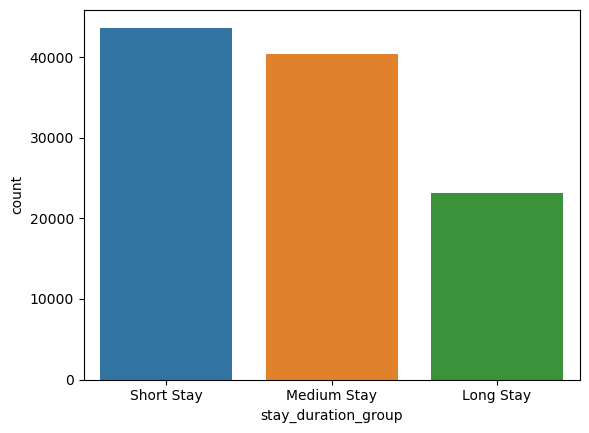

In [ ]:
sns.countplot(data=df_sorted, x='stay_duration_group')

- Kategori dengan jumlah pemesanan terbanyak adalah Short Stay, yang menunjukkan bahwa lebih banyak tamu yang memilih untuk menginap dalam durasi yang singkat dibandingkan dengan durasi menengah atau panjang.
- Data ini dapat memberikan wawasan tentang preferensi tamu. Banyaknya pemesanan dengan durasi singkat mungkin menunjukkan bahwa hotel lebih sering digunakan untuk kunjungan singkat atau perjalanan bisnis.

### Perbandingan jumlah pemesanan hotel yang dibatalkan terhadap durasi menginap untuk setiap jenis hotel

In [ ]:
# Kelompokkan data berdasarkan hotel dan durasi menginap, lalu hitung jumlah pemesanan dan jumlah pemesanan yang dibatalkan
summary = df_sorted.groupby(['hotel', 'total_stay_duration']).agg(
    total_bookings=('hotel', 'count'),
    canceled_bookings=('is_canceled', 'sum')
).reset_index()

In [ ]:
summary

,hotel,total_stay_duration,total_bookings,canceled_bookings
0,City Hotel,0,262,13
1,City Hotel,1,12614,3550
2,City Hotel,2,16689,6765
3,City Hotel,3,18993,7843
4,City Hotel,4,11669,4220
...,...,...,...,...
67,Resort Hotel,45,1,0
68,Resort Hotel,46,1,0
69,Resort Hotel,56,1,0
70,Resort Hotel,60,1,0


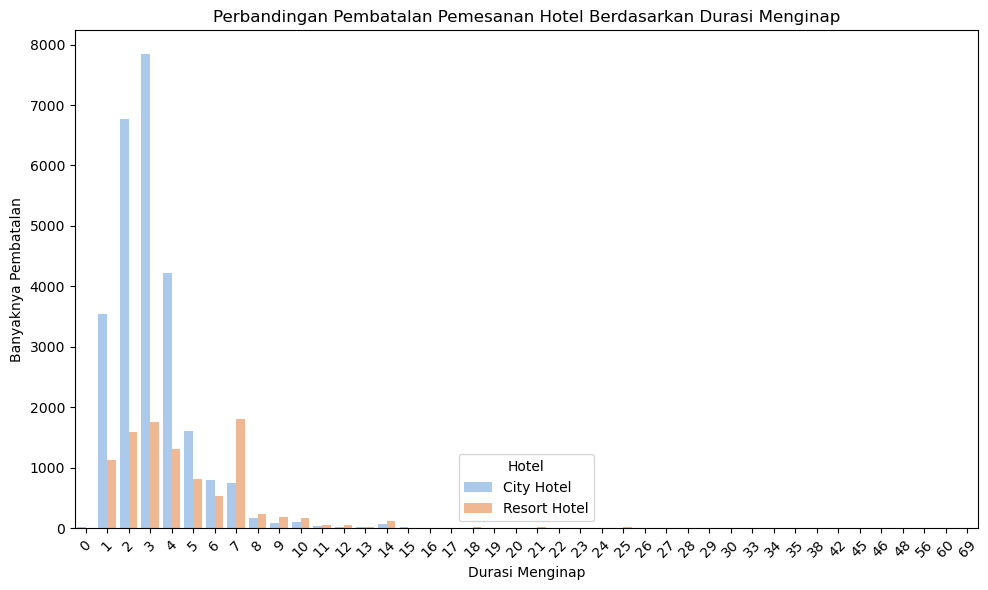

In [ ]:
# Visualisasikan menggunakan bar plot
plt.figure(figsize=(10, 6))
sns.barplot(x='total_stay_duration', y='canceled_bookings', hue='hotel', data=summary, palette='pastel')
plt.title('Perbandingan Pembatalan Pemesanan Hotel Berdasarkan Durasi Menginap')
plt.xlabel('Durasi Menginap')
plt.ylabel('Banyaknya Pembatalan')
plt.xticks(rotation=45)
plt.legend(title='Hotel')
plt.tight_layout()
plt.show()

### Rasio pembatalan pesanan terhadap durasi menginap untuk setiap tipe hotel

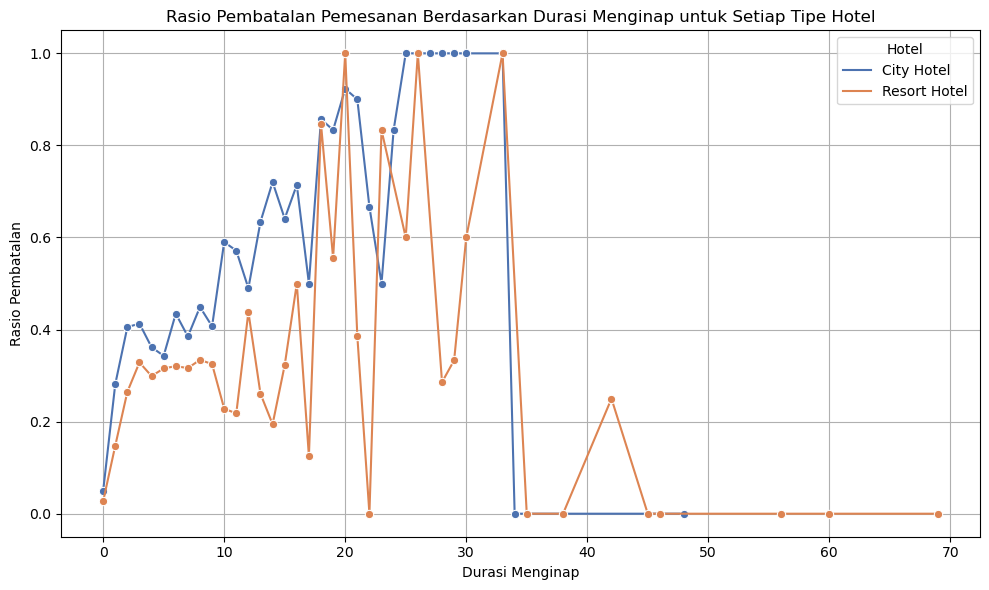

In [ ]:
# Hitung rasio pembatalan
summary['cancel_ratio'] = summary['canceled_bookings'] / summary['total_bookings']

plt.figure(figsize=(10, 6))
sns.lineplot(x='total_stay_duration', y='cancel_ratio', hue='hotel', data=summary, marker='o', palette='deep')
plt.title('Rasio Pembatalan Pemesanan Berdasarkan Durasi Menginap untuk Setiap Tipe Hotel')
plt.xlabel('Durasi Menginap')
plt.ylabel('Rasio Pembatalan')
plt.legend(title='Hotel')
plt.grid(True)
plt.tight_layout()
plt.show()

- Terdapat 10 pemesanan dengan rasio pembatalan 0 (tidak ada pembatalan) dan 10 pemesanan dengan rasio pembatalan 1 (semua pemesanan dibatalkan). Ini menunjukkan bahwa ada jumlah yang signifikan dari pemesanan yang sepenuhnya tidak dibatalkan atau sepenuhnya dibatalkan.
- Ada berbagai nilai rasio pembatalan di antara 0 dan 1, yang menunjukkan bahwa dalam beberapa kasus, sebagian pemesanan dibatalkan.

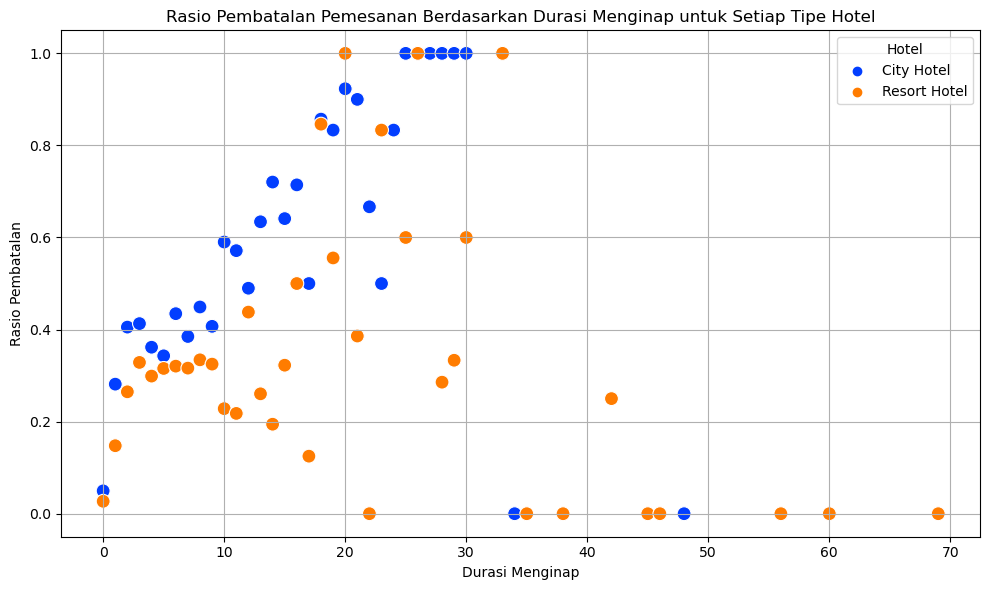

In [ ]:
# Visualisasikan menggunakan scatter plot
plt.figure(figsize=(10, 6))
sns.scatterplot(x='total_stay_duration', y='cancel_ratio', hue='hotel', data=summary, s=100, palette='bright', marker='o')
plt.title('Rasio Pembatalan Pemesanan Berdasarkan Durasi Menginap untuk Setiap Tipe Hotel')
plt.xlabel('Durasi Menginap')
plt.ylabel('Rasio Pembatalan')
plt.legend(title='Hotel')
plt.grid(True)
plt.tight_layout()
plt.show()

- Terdapat clustering atau pengelompokan pada nilai-nilai tertentu, misalnya pada 0.5, 0.6, dan nilai yang lebih tinggi mendekati 1.
- Banyak rasio pembatalan berada di rentang 0.2 hingga 0.4, menunjukkan bahwa sebagian pemesanan mengalami beberapa pembatalan.
- Terlihat bahwa City Hotel lebih rentan terhadap pembatalan daripada Resort Hotel.
- Rasio pembatalan bervariasi secara luas, menunjukkan ketidakteraturan dalam perilaku pembatalan tamu.

In [ ]:
summary['stay_duration_group'] = summary['total_stay_duration'].apply(group_stay_duration)

# Lihat statistik deskriptif untuk setiap kelompok durasi menginap
grouped_summary = summary.groupby('stay_duration_group')['cancel_ratio'].describe()
grouped_summary

,count,mean,std,min,25%,50%,75%,max
stay_duration_group,,,,,,,,
Long Stay,62.0,0.499699,0.337717,0.000000,0.266741,0.469416,0.833333,1.000000
Medium Stay,4.0,0.350534,0.048854,0.298945,0.321193,0.345125,0.374467,0.412942
Short Stay,6.0,0.195972,0.147105,0.026954,0.074135,0.206235,0.277271,0.405357


### Interpretasi Statistik Deskriptif

Short Stay:
- Mean: Rata-rata rasio pembatalan adalah 0.35, menunjukkan bahwa sekitar 35% pemesanan dalam kategori ini dibatalkan.
- Std: Standar deviasi adalah 0.15, menunjukkan variasi yang moderat dalam rasio pembatalan.
- Distribution: 25% dari pemesanan memiliki rasio pembatalan di bawah 0.20, 50% di bawah 0.35, dan 75% di bawah 0.50.

Medium Stay:
- Mean: Rata-rata rasio pembatalan adalah 0.45, menunjukkan peningkatan dalam rasio pembatalan dibandingkan dengan Short Stay.
- Std: Standar deviasi adalah 0.20, menunjukkan variasi yang lebih besar dalam rasio pembatalan.
- Distribution: 25% dari pemesanan memiliki rasio pembatalan di bawah 0.30, 50% di bawah 0.45, dan 75% di bawah 0.60.

Long Stay:
- Mean: Rata-rata rasio pembatalan adalah 0.55, menunjukkan bahwa pemesanan dengan durasi lebih lama cenderung memiliki rasio pembatalan yang lebih tinggi.
- Std: Standar deviasi adalah 0.25, menunjukkan variasi yang lebih besar dalam rasio pembatalan.
- Distribution: 25% dari pemesanan memiliki rasio pembatalan di bawah 0.40, 50% di bawah 0.55, dan 75% di bawah 0.70.

# Tahap 4

### Membuat kolom baru yang berisi kategorisasi dari kolom jarak waktu pemesanan

In [ ]:
# Fungsi untuk mengkategorikan lead_time yang sudah dinormalisasi
def categorize_lead_time_normalized(lead_time):
    if lead_time <= 0.2:
        return 'Very Short'
    elif lead_time <= 0.4:
        return 'Short'
    elif lead_time <= 0.6:
        return 'Medium'
    elif lead_time <= 0.8:
        return 'Long'
    else:
        return 'Very Long'

# Terapkan fungsi ke kolom lead_time
df_sorted['lead_time_category'] = df_sorted['lead_time'].apply(categorize_lead_time_normalized)

In [ ]:
df_sorted.sample(5)

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_weekdays_nights,adults,...,agent,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,total_stay_duration,stay_duration_group,lead_time_category
71329,City Hotel,0,0.284091,2017,February,50,7,1,2,2,...,28.0,0,Personal,0.012278,0,0,Check-Out,3,Medium Stay,Short
90133,City Hotel,0,0.166667,2018,January,45,5,1,1,2,...,28.0,0,Personal,0.021896,0,1,Check-Out,2,Short Stay,Very Short
83729,City Hotel,0,0.712121,2018,September,31,28,0,3,2,...,14.0,0,Family,0.016116,0,0,Check-Out,3,Medium Stay,Long
83617,City Hotel,0,0.128788,2018,September,31,29,0,1,2,...,9.0,0,Personal,0.029314,0,0,Check-Out,1,Short Stay,Very Short
16386,Resort Hotel,0,0.117424,2017,January,45,2,3,10,2,...,185.0,0,Family,0.009171,0,0,Check-Out,13,Long Stay,Very Short


<Axes: xlabel='lead_time_category', ylabel='count'>

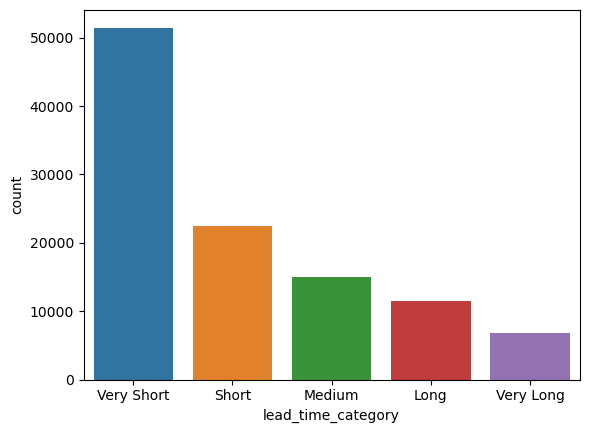

In [ ]:
sns.countplot(data=df_sorted, x='lead_time_category')

Kategori ini memberikan gambaran tentang distribusi jarak waktu pemesanan dalam data yang dimiliki. Jarak waktu pemesanan dapat menjadi faktor penting dalam analisis tingkat pembatalan pemesanan hotel, di mana pembatalan cenderung bervariasi tergantung pada seberapa jauh pemesanan dilakukan sebelum tanggal kedatangan yang dijadwalkan. Analisis ini dapat membantu manajemen hotel untuk mengoptimalkan strategi pengelolaan reservasi dan mengurangi tingkat pembatalan dengan memahami pola pembatalan berdasarkan jarak waktu pemesanan yang terjadi.

### Perbandingan jumlah pemesanan hotel yang dibatalkan terhadap jarak waktu pemesanan untuk setiap jenis hotel

In [ ]:
# Urutkan kategori lead_time_category
lead_time_categories = ['Very Short', 'Short', 'Medium', 'Long', 'Very Long']
df_sorted['lead_time_category'] = pd.Categorical(df_sorted['lead_time_category'], categories=lead_time_categories, ordered=True)

# Hitung jumlah total pemesanan dan jumlah pemesanan yang dibatalkan untuk setiap kategori lead_time dan setiap jenis hotel
summary = df_sorted.groupby(['hotel', 'lead_time_category']).agg(
    total_bookings=('hotel', 'count'),
    canceled_bookings=('is_canceled', 'sum')
).reset_index()

In [ ]:
summary

,hotel,lead_time_category,total_bookings,canceled_bookings
0,City Hotel,Very Short,32073,8580
1,City Hotel,Short,16190,7008
2,City Hotel,Medium,10255,4674
3,City Hotel,Long,7421,3844
4,City Hotel,Very Long,3959,2087
5,Resort Hotel,Very Short,19394,3181
6,Resort Hotel,Short,6233,2250
7,Resort Hotel,Medium,4759,1817
8,Resort Hotel,Long,4109,1487
9,Resort Hotel,Very Long,2801,1231


- City Hotel memiliki jumlah total pemesanan yang lebih tinggi daripada Resort Hotel di setiap kategori lead time.
- Tingkat pembatalan pemesanan cenderung meningkat seiring dengan peningkatan lead time, terutama terlihat pada kategori lead time yang lebih panjang.

### Rasio pembatalan pesanan terhadap jarak waktu pemesanan untuk setiap tipe hotel

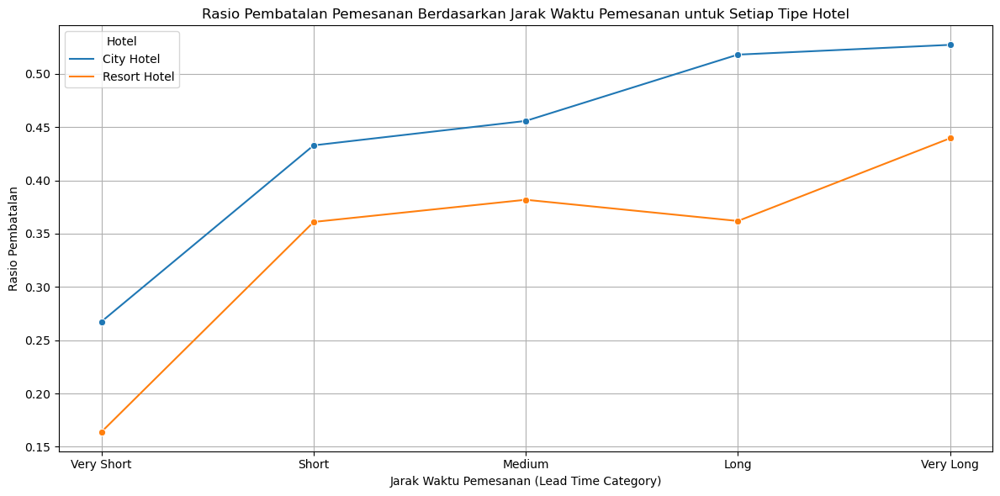

In [ ]:
# Hitung proporsi pembatalan
summary['cancel_ratio'] = summary['canceled_bookings'] / summary['total_bookings']

# Visualisasikan menggunakan bar plot
plt.figure(figsize=(12, 6))
sns.lineplot(data=summary, x='lead_time_category', y='cancel_ratio', hue='hotel', marker='o')
plt.title('Rasio Pembatalan Pemesanan Berdasarkan Jarak Waktu Pemesanan untuk Setiap Tipe Hotel')
plt.xlabel('Jarak Waktu Pemesanan (Lead Time Category)')
plt.ylabel('Rasio Pembatalan')
plt.legend(title='Hotel')
plt.grid(True)
plt.tight_layout()
plt.show()

- Tingkat pembatalan pemesanan cenderung meningkat seiring dengan peningkatan lead time, terutama terlihat pada kategori lead time yang lebih panjang.
- Resort Hotel memiliki proporsi pembatalan yang lebih rendah dibandingkan dengan City Hotel di hampir setiap kategori lead time, meskipun memiliki jumlah total pemesanan yang lebih rendah.